# SEM Image Analysis: Vertically Aligned Nanostructures (VANS)

**Objective:** Analyze the morphology, specifically pillar size and distribution, of Vertically Aligned Nanostructures from an SEM plan-view image. The analysis aims to be robust against noise and other image features, providing publication-quality reports and images.

**Methodology:**
1. Load and preprocess the SEM image.
2. Segment the pillar structures from the background.
3. Extract features (e.g., size) of each identified pillar.
4. Perform statistical analysis and visualize the size distribution.
5. Provide an option for pixel-to-nanometer conversion.

## 1. Setup and Library Imports

In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, filters, morphology, measure, segmentation, util as skimage_util
from scipy import ndimage
from scipy.stats import gaussian_kde
from scipy.ndimage import maximum_filter
import pandas as pd
import seaborn as sns
from matplotlib import patches
import os
from typing import Tuple, Dict, List
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# Simple alternative to peak_local_maxima
def peak_local_maxima(image, min_distance=1, threshold_abs=None, threshold_rel=None):
    """Simple implementation of local maxima detection."""
    # Use maximum filter to find local maxima
    neighborhood_size = min_distance * 2 + 1
    local_max = (image == maximum_filter(image, size=neighborhood_size))
    
    # Apply thresholds
    if threshold_abs is not None:
        local_max = local_max & (image >= threshold_abs)
    elif threshold_rel is not None:
        local_max = local_max & (image >= threshold_rel * image.max())
    
    # Return coordinates as array
    coords = np.where(local_max)
    return np.column_stack(coords)

# Configure Matplotlib for publication-quality plots
%matplotlib inline
plt.style.use('default')
plt.rcParams['figure.figsize'] = (10, 8)
plt.rcParams['figure.dpi'] = 150
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 12
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['axes.linewidth'] = 1.2
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.grid'] = True

print("Libraries imported successfully!")

Libraries imported successfully!


## 2. Configuration and Image Loading

In [72]:
# --- Configuration ---
image_path = '/Users/robertoreis/Documents/codes/VANS/VANs plan-view.jpg'
output_dir = 'analysis_results'

if not os.path.exists(output_dir):
    os.makedirs(output_dir)
    print(f"Output directory '{output_dir}' created.")
else:
    print(f"Output directory '{output_dir}' already exists.")

pixels_to_nm_factor = 1.0 # nm/pixel - ADJUST THIS BASED ON YOUR SEM SCALE BAR
units = 'pixels' if pixels_to_nm_factor == 1.0 else 'nm'
print(f"Measurements will be in {units}.")
print("Note: Update pixels_to_nm_factor based on your SEM image scale bar for real measurements")

Output directory 'analysis_results' already exists.
Measurements will be in pixels.
Note: Update pixels_to_nm_factor based on your SEM image scale bar for real measurements


Image loaded successfully: /Users/robertoreis/Documents/codes/VANS/VANs plan-view.jpg
Image shape: (1621, 2312, 3), Data type: uint8


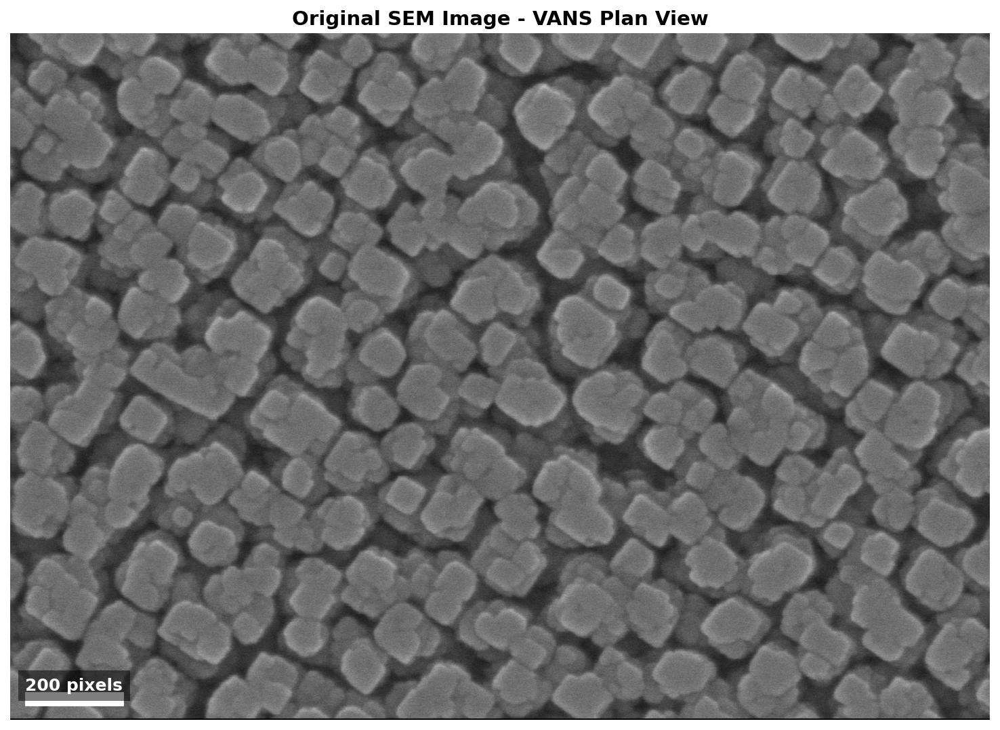

In [73]:
# Load the SEM image
try:
    image_original = io.imread(image_path)
    print(f"Image loaded successfully: {image_path}")
    print(f"Image shape: {image_original.shape}, Data type: {image_original.dtype}")

    # Create figure for display
    plt.figure(figsize=(10, 8))
    plt.imshow(image_original)
    plt.title('Original SEM Image - VANS Plan View', fontsize=14, fontweight='bold')
    
    # Add scale bar
    scale_bar_length_pixels = 200  # Length in pixels
    scale_bar_position = (image_original.shape[1] - 150, image_original.shape[0] - 50)  # Bottom right
    scale_bar_height = 10  # Height of the scale bar
    scale_bar_color = 'white'
    scale_bar_text = f"{scale_bar_length_pixels} {units}"
    
    # Draw the scale bar - positioned bottom left
    scale_bar_position = (50, image_original.shape[0] - 50)  # Bottom left position
    plt.plot([scale_bar_position[0], scale_bar_position[0] + scale_bar_length_pixels], 
             [scale_bar_position[1], scale_bar_position[1]], 
             '-', color=scale_bar_color, linewidth=scale_bar_height)
    
    # Add text label with semi-transparent background
    text_box = plt.text(scale_bar_position[0] + scale_bar_length_pixels/2, 
             scale_bar_position[1] - 20, 
             scale_bar_text, 
             color=scale_bar_color, 
             fontsize=12, 
             fontweight='bold',
             ha='center',
             bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=5))
    
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '00_original_with_scale.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
except FileNotFoundError:
    print(f"Error: Image file not found at {image_path}")
    print("Please check the file path and ensure the image exists.")
    image_original = None

## 3. Image Preprocessing

Convert to grayscale and apply noise reduction for better segmentation.

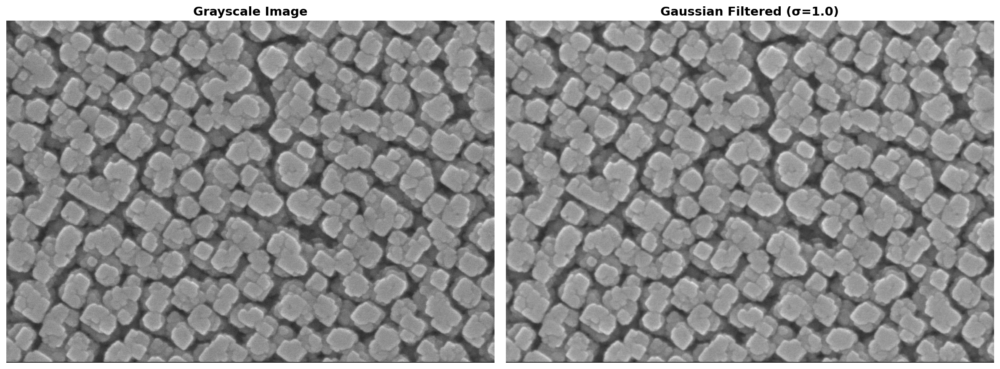

Preprocessing completed. Images saved to analysis_results


In [74]:
if image_original is not None:
    # Convert to grayscale
    if image_original.ndim == 3:
        image_gray = color.rgb2gray(image_original)
    else:
        image_gray = image_original
    
    # Ensure proper data type
    image_gray = skimage_util.img_as_float(image_gray)
    
    # Apply Gaussian blur for noise reduction
    sigma_blur = 1.0
    image_blurred = filters.gaussian(image_gray, sigma=sigma_blur, preserve_range=True)

    # Display preprocessing results
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    axes[0].imshow(image_gray, cmap='gray')
    axes[0].set_title('Grayscale Image', fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(image_blurred, cmap='gray')
    axes[1].set_title(f'Gaussian Filtered (σ={sigma_blur})', fontweight='bold')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '01_preprocessing.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"Preprocessing completed. Images saved to {output_dir}")
else:
    print("Cannot proceed without loaded image.")

## 4. Image Segmentation

Apply multiple segmentation approaches to identify pillar structures robustly.

Otsu threshold: 0.357


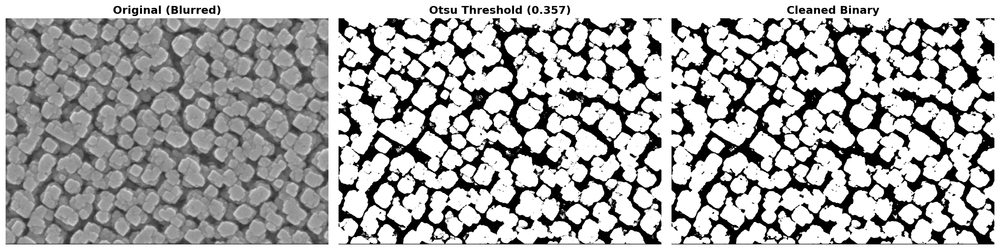

In [75]:
def apply_otsu_threshold(image):
    """Apply Otsu thresholding."""
    threshold = filters.threshold_otsu(image)
    binary = image > threshold
    return binary, threshold

def clean_binary_image(binary, min_size=50):
    """Clean binary image using morphological operations."""
    # Remove small objects
    cleaned = morphology.remove_small_objects(binary, min_size=min_size)
    # Fill small holes
    cleaned = morphology.remove_small_holes(cleaned, area_threshold=20)
    # Opening to separate touching objects
    selem = morphology.disk(2)
    cleaned = morphology.opening(cleaned, selem)
    return cleaned

if 'image_blurred' in locals():
    # Apply Otsu thresholding
    binary_otsu, otsu_threshold = apply_otsu_threshold(image_blurred)
    print(f"Otsu threshold: {otsu_threshold:.3f}")
    
    # Clean the binary image
    binary_clean = clean_binary_image(binary_otsu, min_size=30)
    
    # Display segmentation results
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    axes[0].imshow(image_blurred, cmap='gray')
    axes[0].set_title('Original (Blurred)', fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(binary_otsu, cmap='gray')
    axes[1].set_title(f'Otsu Threshold ({otsu_threshold:.3f})', fontweight='bold')
    axes[1].axis('off')
    
    axes[2].imshow(binary_clean, cmap='gray')
    axes[2].set_title('Cleaned Binary', fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '02_segmentation.png'), dpi=300, bbox_inches='tight')
    plt.show()
else:
    print("Blurred image not available. Please run preprocessing first.")

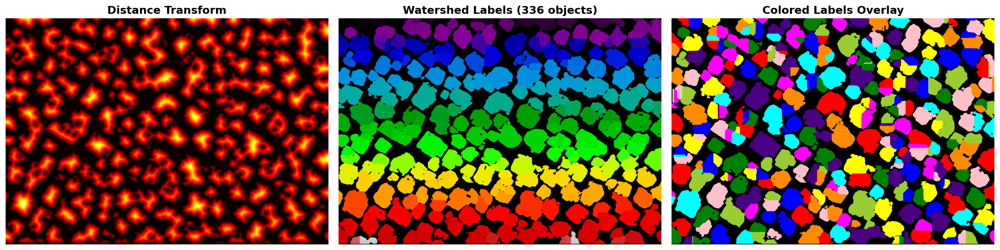

Watershed segmentation completed. Found 336 pillar objects.


In [76]:
def apply_watershed_segmentation(binary, distance_image):
    """Apply watershed segmentation to separate touching objects."""
    # Distance transform
    distance = ndimage.distance_transform_edt(binary)
    
    # Find local maxima as seeds
    local_maxima = peak_local_maxima(distance, min_distance=10, threshold_abs=0.3*distance.max())
    markers = np.zeros_like(distance, dtype=int)
    if len(local_maxima) > 0:
        markers[tuple(local_maxima.T)] = np.arange(1, len(local_maxima) + 1)
    
    # Apply watershed
    labels = segmentation.watershed(-distance, markers, mask=binary)
    
    return labels, distance

if 'binary_clean' in locals():
    # Apply watershed segmentation
    labels_watershed, distance_map = apply_watershed_segmentation(binary_clean, image_blurred)
    
    # Create colored visualization
    label_image_colored = color.label2rgb(labels_watershed, bg_label=0)
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    axes[0].imshow(distance_map, cmap='hot')
    axes[0].set_title('Distance Transform', fontweight='bold')
    axes[0].axis('off')
    
    axes[1].imshow(labels_watershed, cmap='nipy_spectral')
    axes[1].set_title(f'Watershed Labels ({labels_watershed.max()} objects)', fontweight='bold')
    axes[1].axis('off')
    
    axes[2].imshow(label_image_colored)
    axes[2].set_title('Colored Labels Overlay', fontweight='bold')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '03_watershed.png'), dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"Watershed segmentation completed. Found {labels_watershed.max()} pillar objects.")
else:
    print("Binary image not available. Please run segmentation first.")

## 5. Feature Extraction

Extract comprehensive morphological features from each identified pillar.

In [77]:
def extract_pillar_features(labels, pixel_to_nm=1.0):
    """Extract comprehensive features from labeled regions."""
    regions = measure.regionprops(labels)
    features = []
    
    for region in regions:
        # Basic measurements
        area_pixels = region.area
        area_scaled = area_pixels * (pixel_to_nm ** 2)
        equivalent_diameter = np.sqrt(4 * area_scaled / np.pi)
        
        # Shape measurements
        perimeter = region.perimeter * pixel_to_nm
        circularity = (4 * np.pi * area_scaled) / (perimeter ** 2) if perimeter > 0 else 0
        
        # Bounding box measurements
        bbox = region.bbox
        width = (bbox[3] - bbox[1]) * pixel_to_nm
        height = (bbox[2] - bbox[0]) * pixel_to_nm
        aspect_ratio = max(width, height) / min(width, height) if min(width, height) > 0 else 0
        
        # Centroid coordinates
        centroid_y, centroid_x = region.centroid
        
        features.append({
            'label': region.label,
            'area_pixels': area_pixels,
            'area_scaled': area_scaled,
            'equivalent_diameter': equivalent_diameter,
            'perimeter': perimeter,
            'circularity': circularity,
            'width': width,
            'height': height,
            'aspect_ratio': aspect_ratio,
            'centroid_x': centroid_x * pixel_to_nm,
            'centroid_y': centroid_y * pixel_to_nm,
            'eccentricity': region.eccentricity,
            'solidity': region.solidity,
            'extent': region.extent
        })
    
    return pd.DataFrame(features)

def filter_outliers(df, column='equivalent_diameter', method='iqr', factor=1.5):
    """Remove outliers from the dataset."""
    if method == 'iqr':
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - factor * IQR
        upper_bound = Q3 + factor * IQR
        return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

if 'labels_watershed' in locals():
    # Extract features
    pillar_features = extract_pillar_features(labels_watershed, pixels_to_nm_factor)
    
    # Filter outliers
    pillar_features_filtered = filter_outliers(pillar_features, 'equivalent_diameter', factor=2.0)
    n_removed = len(pillar_features) - len(pillar_features_filtered)
    
    print(f"Feature extraction completed:")
    print(f"  • Total objects detected: {len(pillar_features)}")
    print(f"  • Objects after outlier removal: {len(pillar_features_filtered)}")
    print(f"  • Outliers removed: {n_removed}")
    
    # Display basic statistics
    print(f"\n=== BASIC PILLAR STATISTICS ===")
    stats_cols = ['equivalent_diameter', 'area_scaled', 'circularity', 'aspect_ratio']
    print(pillar_features_filtered[stats_cols].describe().round(3))
    
else:
    print("Watershed labels not available. Please run watershed segmentation first.")

Feature extraction completed:
  • Total objects detected: 336
  • Objects after outlier removal: 336
  • Outliers removed: 0

=== BASIC PILLAR STATISTICS ===
       equivalent_diameter  area_scaled  circularity  aspect_ratio
count              336.000      336.000      336.000       336.000
mean                91.246     7554.283        0.585         3.222
std                 36.005     5281.763        0.143         9.103
min                  6.283       31.000        0.110         1.000
25%                 70.069     3856.000        0.511         1.113
50%                 90.962     6498.500        0.620         1.265
75%                113.221    10068.000        0.686         1.575
max                191.386    28768.000        0.849        58.000


## 6. Statistical Analysis and Publication Plots

Generate publication-quality statistical analysis and visualizations.

/var/folders/m3/fdsx0z8944b6_th83kt65w_r0000gn/T/ipykernel_24777/3881205148.py:37: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax2.boxplot([df['equivalent_diameter']], patch_artist=True, labels=['Diameter'])


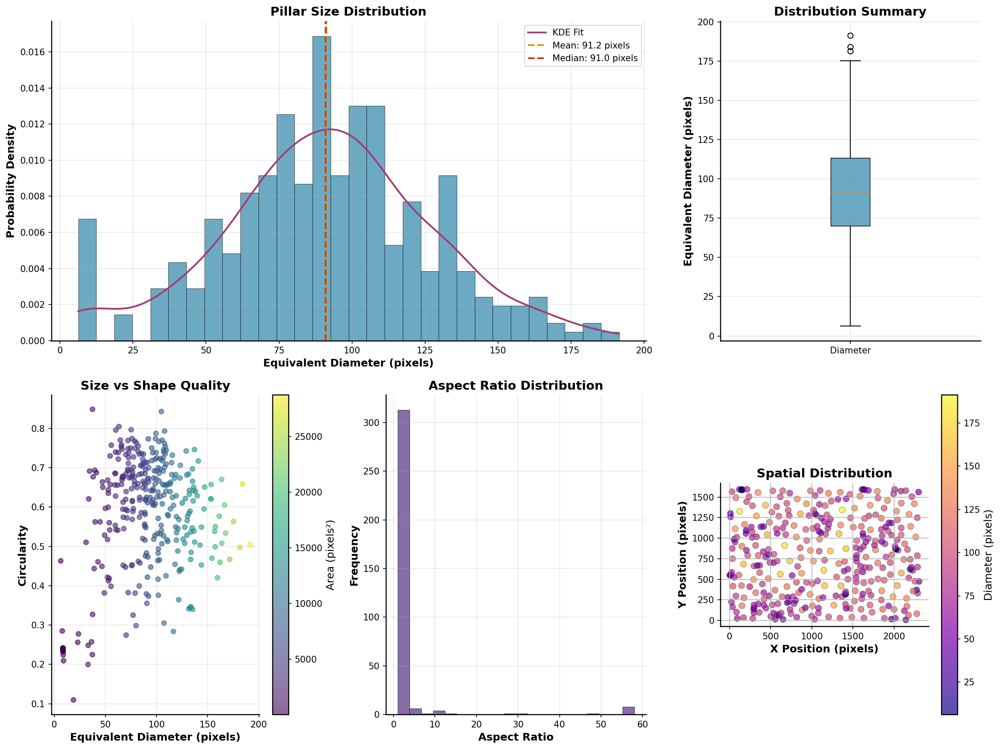

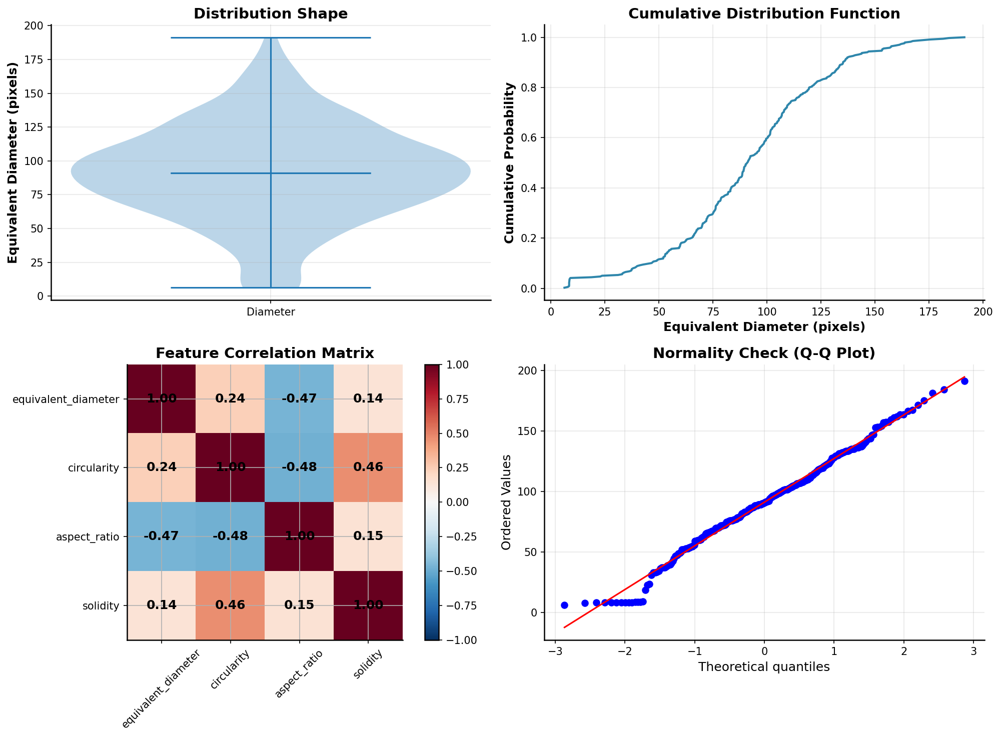

In [78]:
def create_publication_plots(df, output_dir, units='pixels'):
    """Create comprehensive publication-quality plots."""
    
    # Color scheme for publication
    colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#592E83']
    
    # Main comprehensive figure
    fig = plt.figure(figsize=(16, 12))
    
    # 1. Size distribution histogram with statistics
    ax1 = plt.subplot(2, 3, (1, 2))
    n, bins, patches = ax1.hist(df['equivalent_diameter'], bins=30, density=True, 
                               alpha=0.7, color=colors[0], edgecolor='black', linewidth=0.5)
    
    # Fit and plot KDE
    kde = gaussian_kde(df['equivalent_diameter'])
    x_range = np.linspace(df['equivalent_diameter'].min(), df['equivalent_diameter'].max(), 200)
    kde_values = kde(x_range)
    ax1.plot(x_range, kde_values, color=colors[1], linewidth=2, label='KDE Fit')
    
    # Add statistical lines
    mean_val = df['equivalent_diameter'].mean()
    median_val = df['equivalent_diameter'].median()
    ax1.axvline(mean_val, color=colors[2], linestyle='--', linewidth=2, 
                label=f'Mean: {mean_val:.1f} {units}')
    ax1.axvline(median_val, color=colors[3], linestyle='--', linewidth=2, 
                label=f'Median: {median_val:.1f} {units}')
    
    ax1.set_xlabel(f'Equivalent Diameter ({units})', fontweight='bold')
    ax1.set_ylabel('Probability Density', fontweight='bold')
    ax1.set_title('Pillar Size Distribution', fontsize=14, fontweight='bold')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # 2. Box plot
    ax2 = plt.subplot(2, 3, 3)
    bp = ax2.boxplot([df['equivalent_diameter']], patch_artist=True, labels=['Diameter'])
    bp['boxes'][0].set_facecolor(colors[0])
    bp['boxes'][0].set_alpha(0.7)
    ax2.set_ylabel(f'Equivalent Diameter ({units})', fontweight='bold')
    ax2.set_title('Distribution Summary', fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # 3. Size vs Circularity scatter
    ax3 = plt.subplot(2, 3, 4)
    scatter = ax3.scatter(df['equivalent_diameter'], df['circularity'], 
                         alpha=0.6, c=df['area_scaled'], cmap='viridis', s=30)
    ax3.set_xlabel(f'Equivalent Diameter ({units})', fontweight='bold')
    ax3.set_ylabel('Circularity', fontweight='bold')
    ax3.set_title('Size vs Shape Quality', fontweight='bold')
    ax3.grid(True, alpha=0.3)
    plt.colorbar(scatter, ax=ax3, label=f'Area ({units}²)')
    
    # 4. Aspect ratio distribution
    ax4 = plt.subplot(2, 3, 5)
    ax4.hist(df['aspect_ratio'], bins=20, alpha=0.7, color=colors[4], 
             edgecolor='black', linewidth=0.5)
    ax4.set_xlabel('Aspect Ratio', fontweight='bold')
    ax4.set_ylabel('Frequency', fontweight='bold')
    ax4.set_title('Aspect Ratio Distribution', fontweight='bold')
    ax4.grid(True, alpha=0.3)
    
    # 5. Spatial distribution
    ax5 = plt.subplot(2, 3, 6)
    scatter2 = ax5.scatter(df['centroid_x'], df['centroid_y'], 
                          c=df['equivalent_diameter'], cmap='plasma', 
                          s=50, alpha=0.7, edgecolors='black', linewidth=0.3)
    ax5.set_xlabel(f'X Position ({units})', fontweight='bold')
    ax5.set_ylabel(f'Y Position ({units})', fontweight='bold')
    ax5.set_title('Spatial Distribution', fontweight='bold')
    ax5.set_aspect('equal')
    plt.colorbar(scatter2, ax=ax5, label=f'Diameter ({units})')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '04_comprehensive_analysis.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # Additional statistical plots
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Violin plot
    axes[0,0].violinplot([df['equivalent_diameter']], positions=[1], showmeans=True, showmedians=True)
    axes[0,0].set_xticks([1])
    axes[0,0].set_xticklabels(['Diameter'])
    axes[0,0].set_ylabel(f'Equivalent Diameter ({units})', fontweight='bold')
    axes[0,0].set_title('Distribution Shape', fontweight='bold')
    axes[0,0].grid(True, alpha=0.3)
    
    # Cumulative distribution
    sorted_data = np.sort(df['equivalent_diameter'])
    y_values = np.arange(1, len(sorted_data) + 1) / len(sorted_data)
    axes[0,1].plot(sorted_data, y_values, color=colors[0], linewidth=2)
    axes[0,1].set_xlabel(f'Equivalent Diameter ({units})', fontweight='bold')
    axes[0,1].set_ylabel('Cumulative Probability', fontweight='bold')
    axes[0,1].set_title('Cumulative Distribution Function', fontweight='bold')
    axes[0,1].grid(True, alpha=0.3)
    
    # Size correlation matrix heatmap
    corr_cols = ['equivalent_diameter', 'circularity', 'aspect_ratio', 'solidity']
    corr_matrix = df[corr_cols].corr()
    im = axes[1,0].imshow(corr_matrix, cmap='RdBu_r', vmin=-1, vmax=1)
    axes[1,0].set_xticks(range(len(corr_cols)))
    axes[1,0].set_yticks(range(len(corr_cols)))
    axes[1,0].set_xticklabels(corr_cols, rotation=45)
    axes[1,0].set_yticklabels(corr_cols)
    axes[1,0].set_title('Feature Correlation Matrix', fontweight='bold')
    
    # Add correlation values to heatmap
    for i in range(len(corr_cols)):
        for j in range(len(corr_cols)):
            axes[1,0].text(j, i, f'{corr_matrix.iloc[i,j]:.2f}', 
                          ha='center', va='center', fontweight='bold')
    
    plt.colorbar(im, ax=axes[1,0])
    
    # Q-Q plot for normality
    from scipy import stats
    stats.probplot(df['equivalent_diameter'], dist="norm", plot=axes[1,1])
    axes[1,1].set_title('Normality Check (Q-Q Plot)', fontweight='bold')
    axes[1,1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '05_advanced_statistics.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()

if 'pillar_features_filtered' in locals():
    create_publication_plots(pillar_features_filtered, output_dir, units)
else:
    print("Filtered pillar features not available. Please run feature extraction first.")

## 7. Statistical Report

Generate detailed statistical analysis and summary tables for publication.

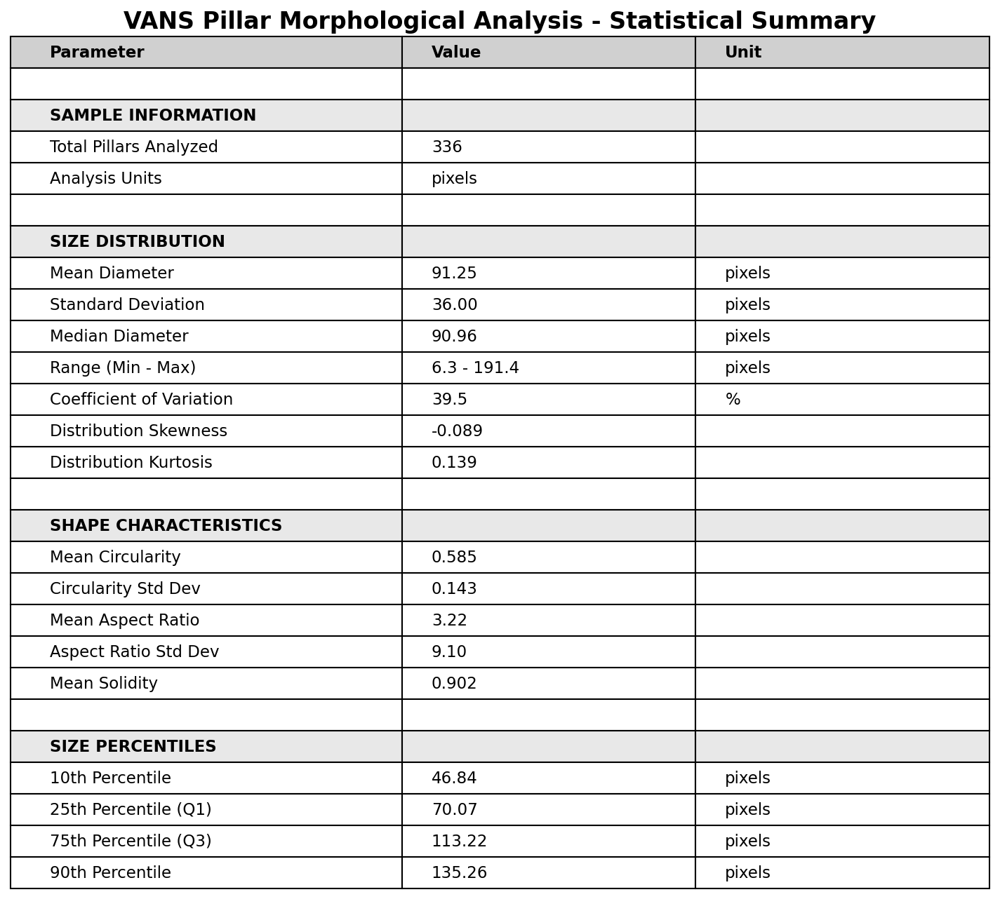


VANS PILLAR ANALYSIS - KEY FINDINGS FOR PUBLICATION
Sample Size: 336 pillars analyzed
Mean Diameter: 91.25 ± 36.00 pixels
Size Range: 6.3 - 191.4 pixels
Coefficient of Variation: 39.5%
Average Circularity: 0.585
Average Aspect Ratio: 3.22
Size Uniformity: variable (CV = 39.5%)
Shape Quality: moderate shape fidelity (circularity = 0.585)
Analysis complete! All results saved to 'analysis_results' directory.


In [79]:
def generate_comprehensive_report(df, units='pixels'):
    """Generate comprehensive statistical report."""
    
    report = {
        'sample_info': {
            'total_pillars': len(df),
            'analysis_units': units,
        },
        'size_statistics': {
            'mean_diameter': df['equivalent_diameter'].mean(),
            'std_diameter': df['equivalent_diameter'].std(),
            'median_diameter': df['equivalent_diameter'].median(),
            'min_diameter': df['equivalent_diameter'].min(),
            'max_diameter': df['equivalent_diameter'].max(),
            'coefficient_variation': df['equivalent_diameter'].std() / df['equivalent_diameter'].mean(),
            'skewness': df['equivalent_diameter'].skew(),
            'kurtosis': df['equivalent_diameter'].kurtosis()
        },
        'shape_statistics': {
            'mean_circularity': df['circularity'].mean(),
            'std_circularity': df['circularity'].std(),
            'mean_aspect_ratio': df['aspect_ratio'].mean(),
            'std_aspect_ratio': df['aspect_ratio'].std(),
            'mean_solidity': df['solidity'].mean()
        },
        'percentiles': {
            '10th': df['equivalent_diameter'].quantile(0.1),
            '25th': df['equivalent_diameter'].quantile(0.25),
            '75th': df['equivalent_diameter'].quantile(0.75),
            '90th': df['equivalent_diameter'].quantile(0.9)
        }
    }
    
    return report

def create_summary_table(report, output_dir):
    """Create publication-ready summary table."""
    
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.axis('tight')
    ax.axis('off')
    
    # Prepare table data
    table_data = [
        ['Parameter', 'Value', 'Unit'],
        ['', '', ''],
        ['SAMPLE INFORMATION', '', ''],
        ['Total Pillars Analyzed', f"{report['sample_info']['total_pillars']}", ''],
        ['Analysis Units', f"{report['sample_info']['analysis_units']}", ''],
        ['', '', ''],
        ['SIZE DISTRIBUTION', '', ''],
        ['Mean Diameter', f"{report['size_statistics']['mean_diameter']:.2f}", report['sample_info']['analysis_units']],
        ['Standard Deviation', f"{report['size_statistics']['std_diameter']:.2f}", report['sample_info']['analysis_units']],
        ['Median Diameter', f"{report['size_statistics']['median_diameter']:.2f}", report['sample_info']['analysis_units']],
        ['Range (Min - Max)', f"{report['size_statistics']['min_diameter']:.1f} - {report['size_statistics']['max_diameter']:.1f}", report['sample_info']['analysis_units']],
        ['Coefficient of Variation', f"{report['size_statistics']['coefficient_variation']*100:.1f}", '%'],
        ['Distribution Skewness', f"{report['size_statistics']['skewness']:.3f}", ''],
        ['Distribution Kurtosis', f"{report['size_statistics']['kurtosis']:.3f}", ''],
        ['', '', ''],
        ['SHAPE CHARACTERISTICS', '', ''],
        ['Mean Circularity', f"{report['shape_statistics']['mean_circularity']:.3f}", ''],
        ['Circularity Std Dev', f"{report['shape_statistics']['std_circularity']:.3f}", ''],
        ['Mean Aspect Ratio', f"{report['shape_statistics']['mean_aspect_ratio']:.2f}", ''],
        ['Aspect Ratio Std Dev', f"{report['shape_statistics']['std_aspect_ratio']:.2f}", ''],
        ['Mean Solidity', f"{report['shape_statistics']['mean_solidity']:.3f}", ''],
        ['', '', ''],
        ['SIZE PERCENTILES', '', ''],
        ['10th Percentile', f"{report['percentiles']['10th']:.2f}", report['sample_info']['analysis_units']],
        ['25th Percentile (Q1)', f"{report['percentiles']['25th']:.2f}", report['sample_info']['analysis_units']],
        ['75th Percentile (Q3)', f"{report['percentiles']['75th']:.2f}", report['sample_info']['analysis_units']],
        ['90th Percentile', f"{report['percentiles']['90th']:.2f}", report['sample_info']['analysis_units']],
    ]
    
    # Create and style table
    table = ax.table(cellText=table_data, cellLoc='left', loc='center', colWidths=[0.4, 0.3, 0.3])
    table.auto_set_font_size(False)
    table.set_fontsize(11)
    table.scale(1, 1.8)
    
    # Style headers and sections
    for i, row in enumerate(table_data):
        if row[0] in ['SAMPLE INFORMATION', 'SIZE DISTRIBUTION', 'SHAPE CHARACTERISTICS', 'SIZE PERCENTILES']:
            for j in range(3):
                table[(i, j)].set_facecolor('#E8E8E8')
                table[(i, j)].set_text_props(weight='bold')
        elif row[0] == 'Parameter':
            for j in range(3):
                table[(i, j)].set_facecolor('#D0D0D0')
                table[(i, j)].set_text_props(weight='bold')
    
    plt.title('VANS Pillar Morphological Analysis - Statistical Summary', 
              fontsize=16, fontweight='bold', pad=20)
    plt.savefig(os.path.join(output_dir, '06_statistical_summary.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()

if 'pillar_features_filtered' in locals():
    # Generate report
    analysis_report = generate_comprehensive_report(pillar_features_filtered, units)
    
    # Create summary table
    create_summary_table(analysis_report, output_dir)
    
    # Save detailed data
    pillar_features_filtered.to_csv(os.path.join(output_dir, 'pillar_analysis_data.csv'), index=False)
    
    # Print key findings for publication
    print("\n" + "="*80)
    print("VANS PILLAR ANALYSIS - KEY FINDINGS FOR PUBLICATION")
    print("="*80)
    print(f"Sample Size: {analysis_report['sample_info']['total_pillars']} pillars analyzed")
    print(f"Mean Diameter: {analysis_report['size_statistics']['mean_diameter']:.2f} ± {analysis_report['size_statistics']['std_diameter']:.2f} {units}")
    print(f"Size Range: {analysis_report['size_statistics']['min_diameter']:.1f} - {analysis_report['size_statistics']['max_diameter']:.1f} {units}")
    print(f"Coefficient of Variation: {analysis_report['size_statistics']['coefficient_variation']*100:.1f}%")
    print(f"Average Circularity: {analysis_report['shape_statistics']['mean_circularity']:.3f}")
    print(f"Average Aspect Ratio: {analysis_report['shape_statistics']['mean_aspect_ratio']:.2f}")
    
    # Size uniformity assessment
    cv = analysis_report['size_statistics']['coefficient_variation'] * 100
    if cv < 15:
        uniformity = "highly uniform"
    elif cv < 25:
        uniformity = "moderately uniform"
    else:
        uniformity = "variable"
    print(f"Size Uniformity: {uniformity} (CV = {cv:.1f}%)")
    
    # Shape quality assessment
    circ = analysis_report['shape_statistics']['mean_circularity']
    if circ > 0.8:
        shape_quality = "excellent circular shape"
    elif circ > 0.6:
        shape_quality = "good circular shape"
    else:
        shape_quality = "moderate shape fidelity"
    print(f"Shape Quality: {shape_quality} (circularity = {circ:.3f})")
    
    print("="*80)
    print(f"Analysis complete! All results saved to '{output_dir}' directory.")
    print("="*80)
    
else:
    print("Filtered pillar features not available. Please run the complete analysis first.")

## 8. Final Results and Recommendations

Summary of analysis results and recommendations for publication use.

In [80]:
# Final summary and file listing
print("="*80)
print("VANS SEM IMAGE ANALYSIS - COMPLETE")
print("="*80)

if 'pillar_features_filtered' in locals():
    print(f"\n📊 ANALYSIS COMPLETED SUCCESSFULLY!")
    print(f"   • {len(pillar_features_filtered)} pillars analyzed")
    print(f"   • Statistical analysis completed")
    print(f"   • Publication-quality plots generated")
    print(f"   • Results saved to '{output_dir}' directory")
    
    print(f"\n📁 OUTPUT FILES GENERATED:")
    output_files = [
        "01_preprocessing.png - Image preprocessing steps",
        "02_segmentation.png - Binary segmentation results", 
        "03_watershed.png - Watershed segmentation",
        "04_comprehensive_analysis.png - Main statistical plots",
        "05_advanced_statistics.png - Advanced statistical analysis",
        "06_statistical_summary.png - Publication summary table",
        "pillar_analysis_data.csv - Complete numerical data"
    ]
    for file in output_files:
        print(f"   • {file}")
    
    print(f"\n🔬 FOR FURTHER ANALYSIS:")
    print(f"   • Update pixels_to_nm_factor for real measurements")
    print(f"   • Consider spatial correlation analysis if needed")
    print(f"   • Use CSV data for statistical software analysis")
    print(f"   • Adjust segmentation parameters if needed for your specific image")

else:
    print("\n❌ ANALYSIS INCOMPLETE")
    print("Please run all cells in sequence to complete the analysis.")

print("="*80)

VANS SEM IMAGE ANALYSIS - COMPLETE

📊 ANALYSIS COMPLETED SUCCESSFULLY!
   • 336 pillars analyzed
   • Statistical analysis completed
   • Publication-quality plots generated
   • Results saved to 'analysis_results' directory

📁 OUTPUT FILES GENERATED:
   • 01_preprocessing.png - Image preprocessing steps
   • 02_segmentation.png - Binary segmentation results
   • 03_watershed.png - Watershed segmentation
   • 04_comprehensive_analysis.png - Main statistical plots
   • 05_advanced_statistics.png - Advanced statistical analysis
   • 06_statistical_summary.png - Publication summary table
   • pillar_analysis_data.csv - Complete numerical data

🔬 FOR FURTHER ANALYSIS:
   • Update pixels_to_nm_factor for real measurements
   • Consider spatial correlation analysis if needed
   • Use CSV data for statistical software analysis
   • Adjust segmentation parameters if needed for your specific image


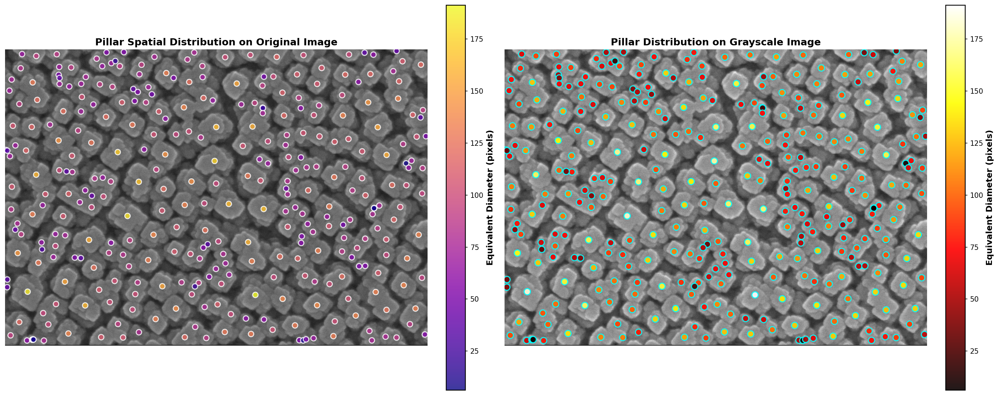

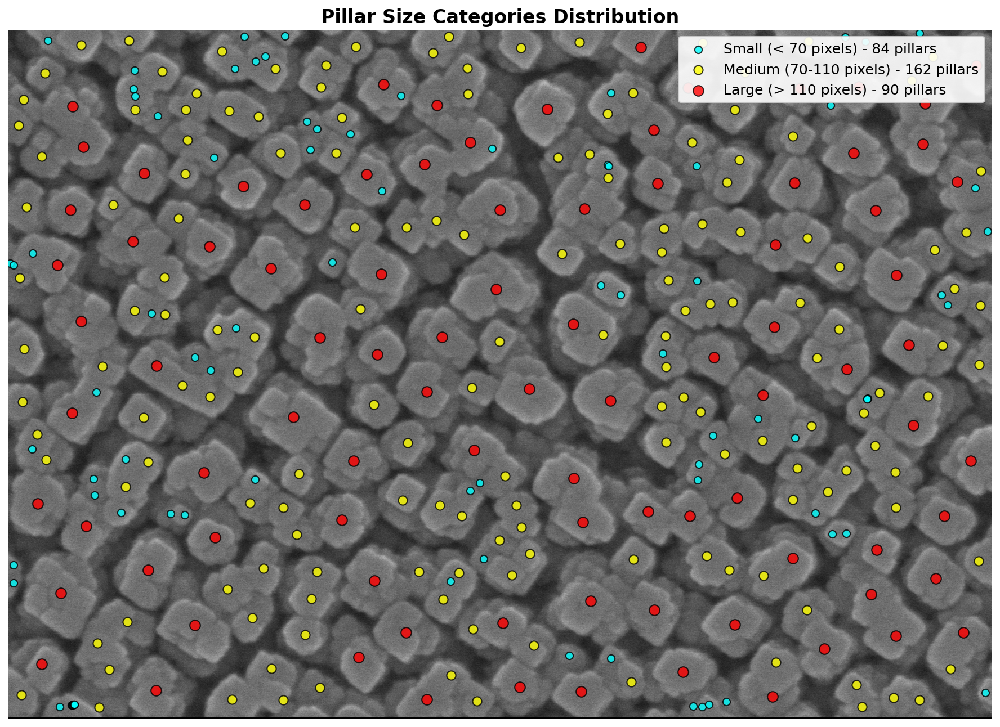


SPATIAL DISTRIBUTION SUMMARY
Small pillars (< 70 pixels): 84 (25.0%)
Medium pillars (70-110 pixels): 162 (48.2%)
Large pillars (> 110 pixels): 90 (26.8%)


In [81]:
# Create spatial distribution overlay on original image
if 'pillar_features_filtered' in locals() and 'image_original' in locals():
    
    fig, axes = plt.subplots(1, 2, figsize=(20, 8))
    
    # Left plot: Original image with pillar locations
    axes[0].imshow(image_original)
    scatter1 = axes[0].scatter(pillar_features_filtered['centroid_x'], 
                              pillar_features_filtered['centroid_y'], 
                              c=pillar_features_filtered['equivalent_diameter'], 
                              cmap='plasma', s=60, alpha=0.8, 
                              edgecolors='white', linewidth=1.5)
    axes[0].set_title('Pillar Spatial Distribution on Original Image', 
                     fontsize=14, fontweight='bold')
    axes[0].axis('off')
    
    # Add colorbar
    cbar1 = plt.colorbar(scatter1, ax=axes[0], fraction=0.046, pad=0.04)
    cbar1.set_label(f'Equivalent Diameter ({units})', fontweight='bold')
    
    # Right plot: Grayscale with enhanced contrast for better visibility
    axes[1].imshow(image_gray, cmap='gray')
    scatter2 = axes[1].scatter(pillar_features_filtered['centroid_x'], 
                              pillar_features_filtered['centroid_y'], 
                              c=pillar_features_filtered['equivalent_diameter'], 
                              cmap='hot', s=80, alpha=0.9, 
                              edgecolors='cyan', linewidth=1.5)
    axes[1].set_title('Pillar Distribution on Grayscale Image', 
                     fontsize=14, fontweight='bold')
    axes[1].axis('off')
    
    # Add colorbar
    cbar2 = plt.colorbar(scatter2, ax=axes[1], fraction=0.046, pad=0.04)
    cbar2.set_label(f'Equivalent Diameter ({units})', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '07_spatial_overlay.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # Additional detailed view - showing size categories
    fig, ax = plt.subplots(figsize=(12, 10))
    
    # Categorize pillars by size
    small_pillars = pillar_features_filtered[pillar_features_filtered['equivalent_diameter'] < 70]
    medium_pillars = pillar_features_filtered[(pillar_features_filtered['equivalent_diameter'] >= 70) & 
                                            (pillar_features_filtered['equivalent_diameter'] < 110)]
    large_pillars = pillar_features_filtered[pillar_features_filtered['equivalent_diameter'] >= 110]
    
    # Display original image
    ax.imshow(image_original)
    
    # Plot different size categories with different colors
    if len(small_pillars) > 0:
        ax.scatter(small_pillars['centroid_x'], small_pillars['centroid_y'], 
                  c='cyan', s=40, alpha=0.8, edgecolors='black', linewidth=1,
                  label=f'Small (< 70 {units}) - {len(small_pillars)} pillars')
    
    if len(medium_pillars) > 0:
        ax.scatter(medium_pillars['centroid_x'], medium_pillars['centroid_y'], 
                  c='yellow', s=60, alpha=0.8, edgecolors='black', linewidth=1,
                  label=f'Medium (70-110 {units}) - {len(medium_pillars)} pillars')
    
    if len(large_pillars) > 0:
        ax.scatter(large_pillars['centroid_x'], large_pillars['centroid_y'], 
                  c='red', s=80, alpha=0.8, edgecolors='black', linewidth=1,
                  label=f'Large (> 110 {units}) - {len(large_pillars)} pillars')
    
    ax.set_title('Pillar Size Categories Distribution', fontsize=16, fontweight='bold')
    ax.legend(loc='upper right', framealpha=0.9, fontsize=12)
    ax.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_dir, '08_size_categories_overlay.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # Print summary of spatial distribution
    print("\n" + "="*60)
    print("SPATIAL DISTRIBUTION SUMMARY")
    print("="*60)
    print(f"Small pillars (< 70 {units}): {len(small_pillars)} ({len(small_pillars)/len(pillar_features_filtered)*100:.1f}%)")
    print(f"Medium pillars (70-110 {units}): {len(medium_pillars)} ({len(medium_pillars)/len(pillar_features_filtered)*100:.1f}%)")
    print(f"Large pillars (> 110 {units}): {len(large_pillars)} ({len(large_pillars)/len(pillar_features_filtered)*100:.1f}%)")
    print("="*60)
    
else:
    print("Pillar features or original image not available. Please run the complete analysis first.")